In [124]:
import os
import pandas as pd
import numpy as np
pd.set_option('future.no_silent_downcasting', True)

# Load list of station pairs
stations_file = 'list_of_stations.csv'
df_stations = pd.read_csv(stations_file, index_col=0)
station_numbers = df_stations.index[:]

In [125]:
# Define input parameters
input_directory = 'combine_selected'
variable_name = 'temp-max_C'
quantile = 0.9
min_duration = 3
float_precision = "%.2f"  # Specify the precision for float values
max_lag = 3  # Example lag window of ±3 days
quantile,min_duration = 0.75, 2
output_directory = f'detected_heatwaves/{variable_name}_q{quantile}_d{min_duration}'
synchronization_output_file = os.path.join(output_directory, 'synchronization_results.csv')
df_sync = pd.read_csv(synchronization_output_file, index_col=(0,1) )
df_sync.columns = df_sync.columns.astype(int)

/var/folders/y7/r3_l1bxn4sv6mkmyfgpt9n880000gn/T/ipykernel_7373/2958977995.py:11: DtypeWarning: Columns (159) have mixed types. Specify dtype option on import or set low_memory=False.
  df_sync = pd.read_csv(synchronization_output_file, index_col=(0,1) )


In [126]:
df_sync

47401                47402                47404  \
station_number start_date                                                   
47401          1950-01-27   NaN  1950-01-27 00:00:00  1950-01-27 00:00:00   
               1950-01-30   NaN  1950-01-30 00:00:00  1950-01-30 00:00:00   
               1950-02-02   NaN                  NaN                  NaN   
               1950-02-08   NaN  1950-02-08 00:00:00  1950-02-08 00:00:00   
               1950-02-24   NaN  1950-02-24 00:00:00  1950-02-24 00:00:00   
...                         ...                  ...                  ...   
47991          2024-02-09   NaN                  NaN                  NaN   
               2024-02-16   NaN                  NaN                  NaN   
               2024-02-23   NaN                  NaN                  NaN   
               2024-03-02   NaN                  NaN                  NaN   
               2024-03-07   NaN                  NaN                  NaN   

                                         47405                47406  \
station_number start_date                                             
47401          1950-01-27  1950-01-27 00:00:00  1950-01-27 00:00:00   
               1950-01-30  1950-01-30 00:00:00                  NaN   
               1950-02-02                  NaN                  NaN   
               1950-02-08                  NaN                  NaN   
               1950-02-24                  NaN  1950-02-24 00:00:00   
...                                        ...                  ...   
47991          2024-02-09                  NaN                  NaN   
               2024-02-16                  NaN                  NaN   
               2024-02-23                  NaN                  NaN   
               2024-03-02                  NaN                  NaN   
               2024-03-07                  NaN                  NaN   

                                         47407                47409  \
station_number start_date                                             
47401          1950-01-27  1950-01-27 00:00:00  1950-01-27 00:00:00   
               1950-01-30                  NaN  1950-01-30 00:00:00   
               1950-02-02                  NaN                  NaN   
               1950-02-08                  NaN                  NaN   
               1950-02-24                  NaN                  NaN   
...                                        ...                  ...   
47991          2024-02-09                  NaN                  NaN   
               2024-02-16                  NaN                  NaN   
               2024-02-23                  NaN                  NaN   
               2024-03-02                  NaN                  NaN   
               2024-03-07                  NaN                  NaN   

                                         47411                47412  \
station_number start_date                                             
47401          1950-01-27  1950-01-27 00:00:00  1950-01-27 00:00:00   
               1950-01-30  1950-01-30 00:00:00  1950-01-30 00:00:00   
               1950-02-02                  NaN                  NaN   
               1950-02-08  1950-02-08 00:00:00  1950-02-07 00:00:00   
               1950-02-24                  NaN  1950-02-24 00:00:00   
...                                        ...                  ...   
47991          2024-02-09                  NaN                  NaN   
               2024-02-16                  NaN                  NaN   
               2024-02-23                  NaN                  NaN   
               2024-03-02                  NaN                  NaN   
               2024-03-07                  NaN                  NaN   

                                         47413  ...                47917  \
station_number start_date                       ...                        
47401          1950-01-27  1950-01-27 00:00:00  ...                  NaN   
               1950-01-3

In [127]:
# Calculate the ratio of non-NaN values to total entries for each station_number in a cleaner way
d1 = df_sync.notna().groupby(level="station_number").sum()  # Count non-NaN values per station_number
d2 = df_sync.groupby(level="station_number").size()  # Total number of entries per station_number

# Broadcasting the division for all rows
df = d1.div(d2, axis=0) * 100
np.fill_diagonal(df.values, np.nan)

In [128]:
df = df.round(1)

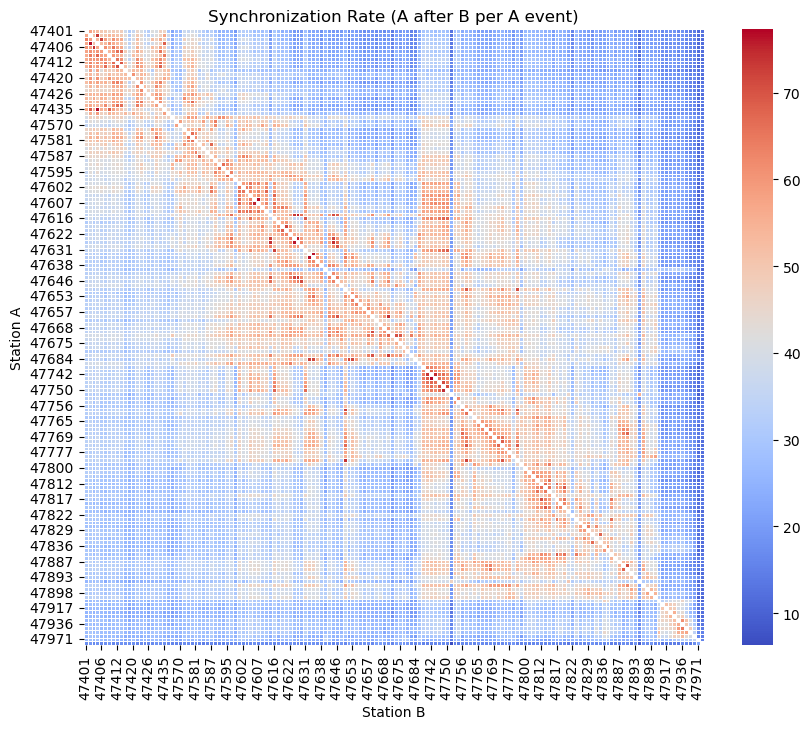

In [129]:
import matplotlib.pyplot as plt
import seaborn as sns
# Ensure all values are numeric and convert any problematic values to NaN
# Plot heatmaps for each synchronization rate DataFrame
plt.figure(figsize=(10, 8))
sns.heatmap(df, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Synchronization Rate (A after B per A event)")
plt.xlabel("Station B")
plt.ylabel("Station A")
plt.show()

In [89]:
df.columns

Index([47401, 47402, 47404, 47405, 47406, 47407, 47409, 47411, 47412, 47413,
       ...
       47917, 47918, 47927, 47929, 47936, 47940, 47942, 47945, 47971, 47991],
      dtype='int64', length=158)

In [77]:
import networkx as nx

In [130]:
# Create a graph object
G = nx.Graph()
# Add nodes (stations)
for station in df.index:
    G.add_node(station)
# Add edges with weights from the DataFrame (excluding NaN values)
for i in df.index:
    for j in df.columns:
        if pd.notna(df.loc[i, j]) and i != j:  # Avoid self-loops
            G.add_edge(i, j, weight=df.loc[i, j])

In [131]:
print(G.edges[(47401, 47402)])

{'weight': 56.8}


In [132]:
df_stations

,station_name,station_name_kana,station_name_roman,fuken_id,type,longitude,latitude,height
47401,稚内,ワツカナイ,Watsukanai,11,S,141.678333,45.415000,2.8
47402,北見枝幸,キタミエサシ,Kitamiesashi,11,S,142.585000,44.940000,6.7
47407,旭川,アサヒカワ,Asahikawa,12,S,142.371667,43.756667,120.0
47404,羽幌,ハボロ,Haboro,13,S,141.700000,44.363333,7.9
47406,留萌,ルモイ,Rumoi,13,S,141.631667,43.945000,23.6
...,...,...,...,...,...,...,...,...
47927,宮古島,ミヤコジマ,Miyakojima,91,S,125.276667,24.793333,39.9
47929,久米島,クメジマ,Kumejima,91,S,126.803333,26.336667,5.0
47917,西表島,イリオモテジマ,Iriomotejima,91,S,123.765000,24.426667,9.9
47912,与那国島,ヨナグニジマ,Yonagunijima,91,S,123.010000,24.466667,30.0


In [133]:
pos = nx.spring_layout(G) # Spring layout for a better visualization

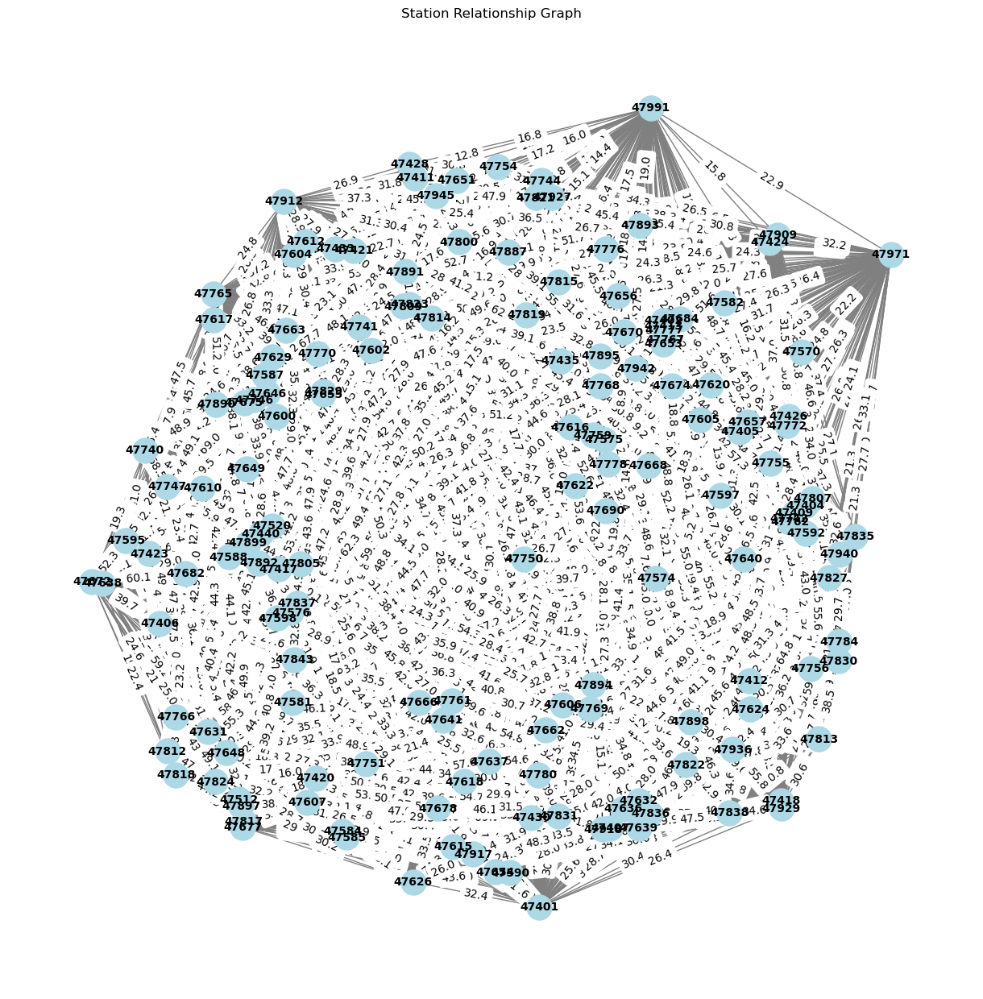

In [134]:
# Step 1: Visualize the graph (basic visualization)
plt.figure(figsize=(12, 12))
# Draw the graph
nx.draw(G, pos, with_labels=True, 
        node_size=500, 
        node_color="lightblue", 
        font_size=10, 
        font_weight='bold', 
        edge_color="gray")
# Add edge weights (the relationship values)
edge_labels = nx.get_edge_attributes(G, 'weight')

nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title("Station Relationship Graph")
plt.show()

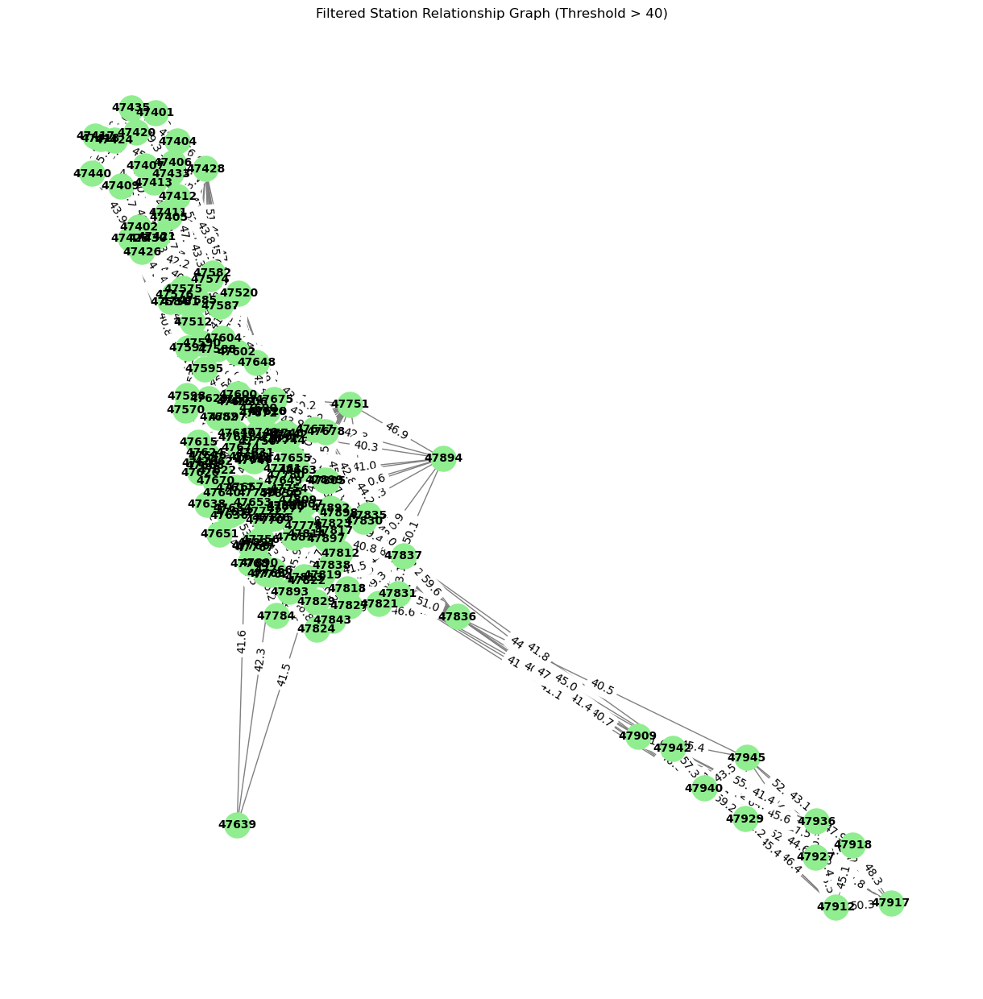

In [135]:
# Optionally, if you want to plot a graph with specific thresholds (e.g., only edges with weight above 0.1):
threshold = 40
filtered_graph = nx.Graph()
for i in df.index:
    for j in df.columns:
        weight = df.loc[i, j]
        if pd.notna(weight) and weight > threshold and i != j:
            filtered_graph.add_edge(i, j, weight=weight)

# Visualize the filtered graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(filtered_graph)
nx.draw(filtered_graph, pos, with_labels=True, node_size=500, node_color="lightgreen", font_size=10, font_weight='bold', edge_color="gray")
edge_labels = nx.get_edge_attributes(filtered_graph, 'weight')
nx.draw_networkx_edge_labels(filtered_graph, pos, edge_labels=edge_labels)
plt.title(f"Filtered Station Relationship Graph (Threshold > {threshold})")
plt.show()

In [136]:
df_stations = df_stations.loc[df.index]
station_positions = { i: (r.longitude, r.latitude) for i, r in df_stations.iterrows() }


In [137]:
# Update positions of existing nodes
for station, (lon, lat) in station_positions.items():
    if station in G.nodes:
        G.nodes[station]['pos'] = (lon, lat)

# Update positions of existing nodes
for station, (lon, lat) in station_positions.items():
    if station in filtered_graph.nodes:
        filtered_graph.nodes[station]['pos'] = (lon, lat)

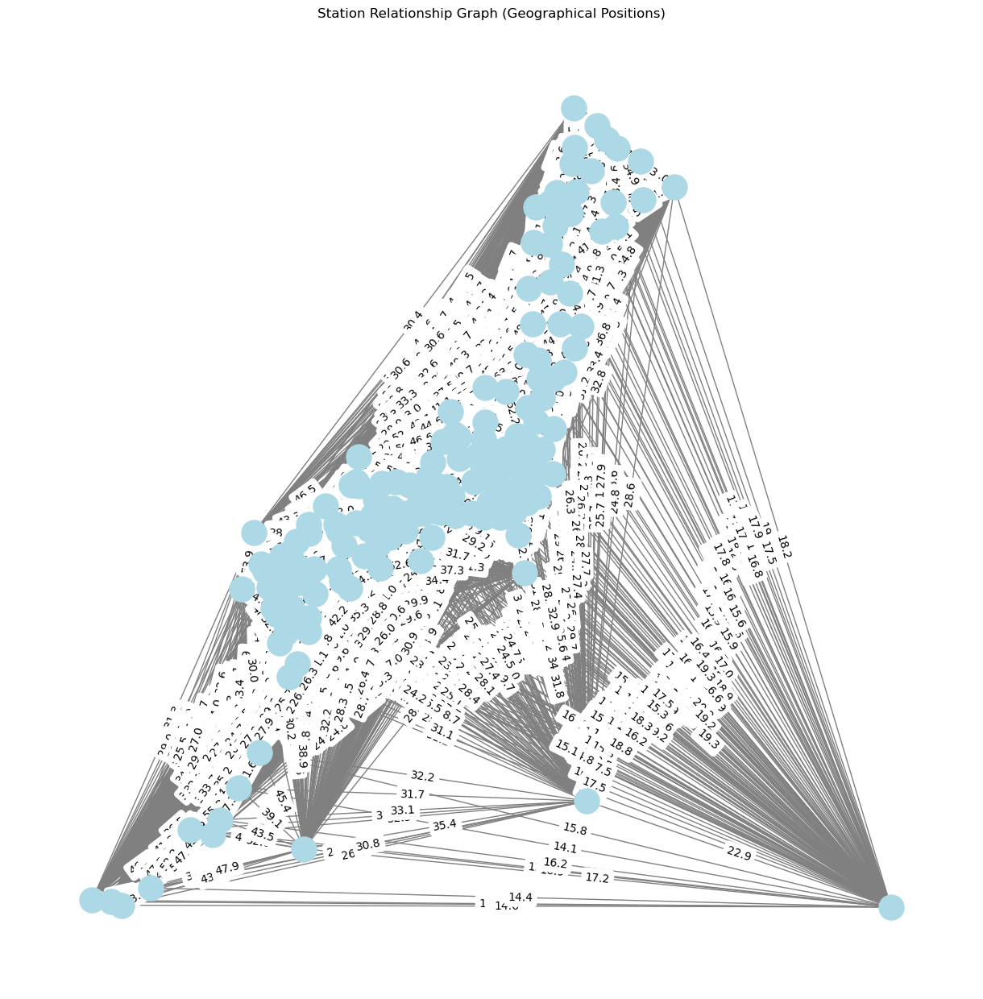

In [138]:
# Step 1: Visualize the graph with geographical positions
plt.figure(figsize=(12, 12))

# Extract positions from the node attributes
pos = nx.get_node_attributes(G, 'pos')

# Draw the graph using the geographical positions
nx.draw(G, pos, with_labels=False, node_size=500, node_color="lightblue", font_size=10, font_weight='bold', edge_color="gray")

# Add edge weights (relationship values) as labels
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Station Relationship Graph (Geographical Positions)")
plt.show()


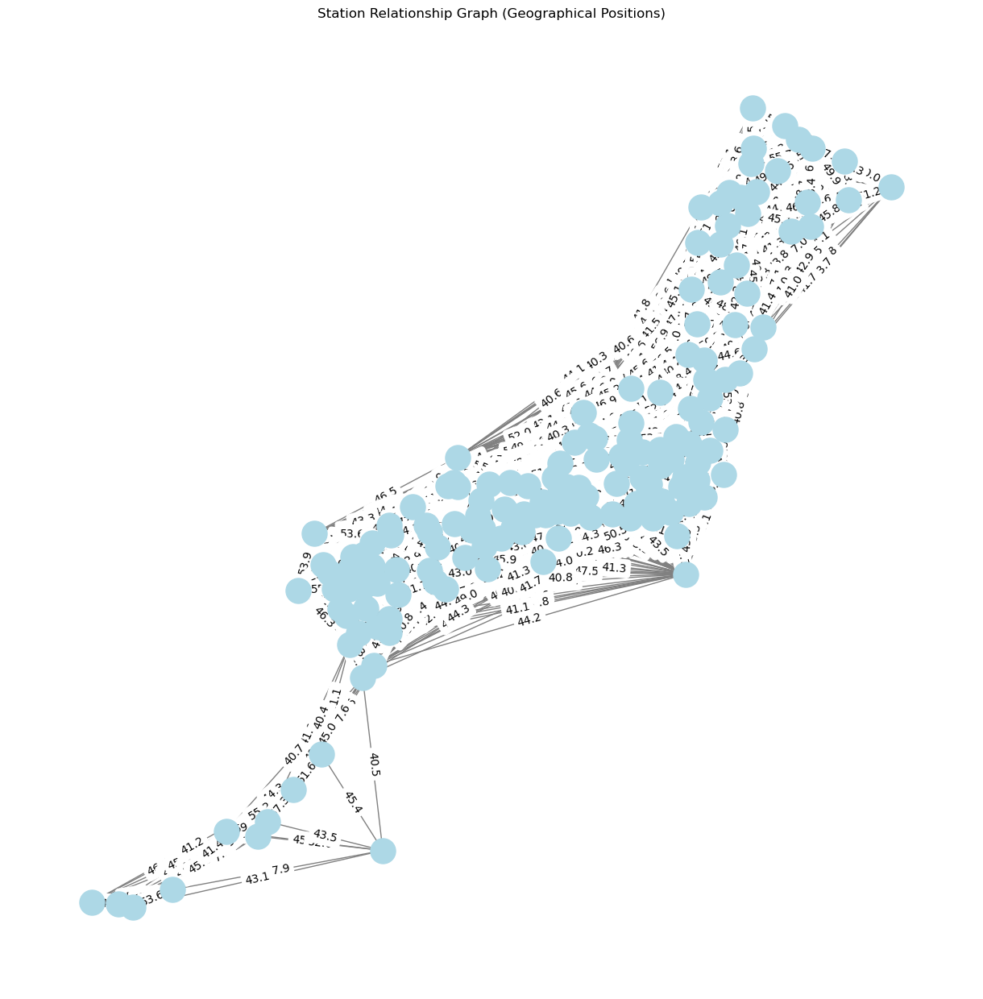

In [139]:
# Step 1: Visualize the graph with geographical positions
plt.figure(figsize=(12, 12))

# Extract positions from the node attributes
pos = nx.get_node_attributes(filtered_graph, 'pos')

# Draw the graph using the geographical positions
nx.draw(filtered_graph, pos, with_labels=False, node_size=500, node_color="lightblue", font_size=10, font_weight='bold', edge_color="gray")

# Add edge weights (relationship values) as labels
edge_labels = nx.get_edge_attributes(filtered_graph, 'weight')
nx.draw_networkx_edge_labels(filtered_graph, pos, edge_labels=edge_labels)

plt.title("Station Relationship Graph (Geographical Positions)")
plt.show()


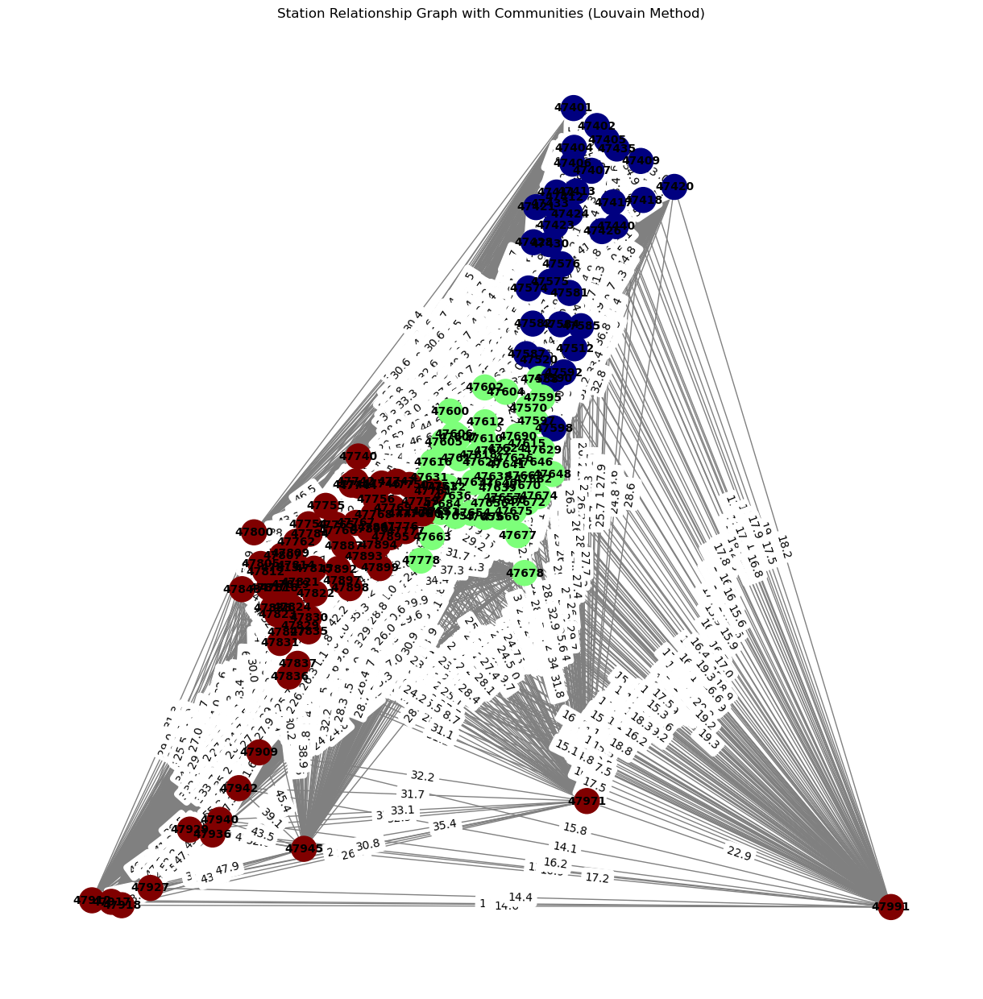

In [140]:
import community as community_louvain  # Louvain method for community detection

# Step 1: Perform community detection (Louvain method)
partition = community_louvain.best_partition(G)  # This gives the community for each node

# Step 2: Visualize the graph with clusters (different colors for each community)
plt.figure(figsize=(12, 12))

# Extract positions from the node attributes
pos = nx.get_node_attributes(G, 'pos')

# Get the community for each node from the partition
node_colors = [partition[node] for node in G.nodes]

# Draw the graph with nodes colored according to their community
nx.draw(G, pos, with_labels=True, node_size=500, node_color=node_colors, cmap=plt.cm.jet, font_size=10, font_weight='bold', edge_color="gray")

# Add edge weights (relationship values) as labels
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

plt.title("Station Relationship Graph with Communities (Louvain Method)")
plt.show()

In [141]:
import networkx as nx
import matplotlib.pyplot as plt

weighted_degree_centrality = nx.degree_centrality(G)
for node in G.nodes:
    weighted_degree_centrality[node] = sum([G[node][neighbor]['weight'] for neighbor in G.neighbors(node)])
#print("Weighted Degree Centrality:", weighted_degree_centrality)

# Weighted Betweenness Centrality
weighted_betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
#print("Weighted Betweenness Centrality:", weighted_betweenness_centrality)

# Weighted Closeness Centrality
weighted_closeness_centrality = nx.closeness_centrality(G, distance='weight')
#print("Weighted Closeness Centrality:", weighted_closeness_centrality)

# Weighted Eigenvector Centrality
weighted_eigenvector_centrality = nx.eigenvector_centrality(G, weight='weight')
#print("Weighted Eigenvector Centrality:", weighted_eigenvector_centrality)

# Weighted Clustering Coefficients
weighted_clustering_coeff = nx.clustering(G, weight='weight')
#print("Weighted Clustering Coefficients:", weighted_clustering_coeff)

# Average Weighted Clustering Coefficient
avg_weighted_clustering_coeff = nx.average_clustering(G, weight='weight')
#print("Average Weighted Clustering Coefficient:", avg_weighted_clustering_coeff)

# Weighted Degree Assortativity Coefficient
weighted_assortativity = nx.degree_assortativity_coefficient(G, weight='weight')
#print("Weighted Degree Assortativity Coefficient:", weighted_assortativity)


In [142]:
import pandas as pd
import networkx as nx
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import numpy as np



# Step 1: Compute centralities (weighted)
weighted_degree_centrality = nx.degree_centrality(G)
for node in G.nodes:
    weighted_degree_centrality[node] = sum([G[node][neighbor]['weight'] for neighbor in G.neighbors(node)])

weighted_betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
weighted_closeness_centrality = nx.closeness_centrality(G, distance='weight')
weighted_eigenvector_centrality = nx.eigenvector_centrality(G, weight='weight')

# Step 2: Plot on Map with Folium
# Initialize the map at the mean latitude and longitude of all stations
map_center = [np.mean([lat for lon, lat in station_positions.values()]), np.mean([lon for lon, lat in station_positions.values()])]
m = folium.Map(location=map_center, zoom_start=7)

# Marker Cluster for Stations
marker_cluster = MarkerCluster().add_to(m)

# Add nodes (stations) to the map
for station, (lon, lat) in station_positions.items():
    # Use the weighted degree centrality to size the node (larger centrality = bigger node)
    size = weighted_degree_centrality[station] * 1000  # Scaling factor
    folium.CircleMarker(
        location=[lat, lon],
        radius=size,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Station {station}<br>Degree Centrality: {weighted_degree_centrality[station]:.4f}",
    ).add_to(marker_cluster)

# Add edges (relationships) to the map
for i, j, data in G.edges(data=True):
    lon_i, lat_i = station_positions[i]
    lon_j, lat_j = station_positions[j]
    # Edge weight as line thickness
    weight = data['weight'] * 10  # Scaling factor for edge weight
    folium.PolyLine(
        locations=[[lat_i, lon_i], [lat_j, lon_j]],
        weight=weight,
        color='gray',
        opacity=0.5
    ).add_to(m)

# Save the map to an HTML file
m.save("graph_map.html")

# Display the map inline (if you're using Jupyter Notebook or JupyterLab)
m


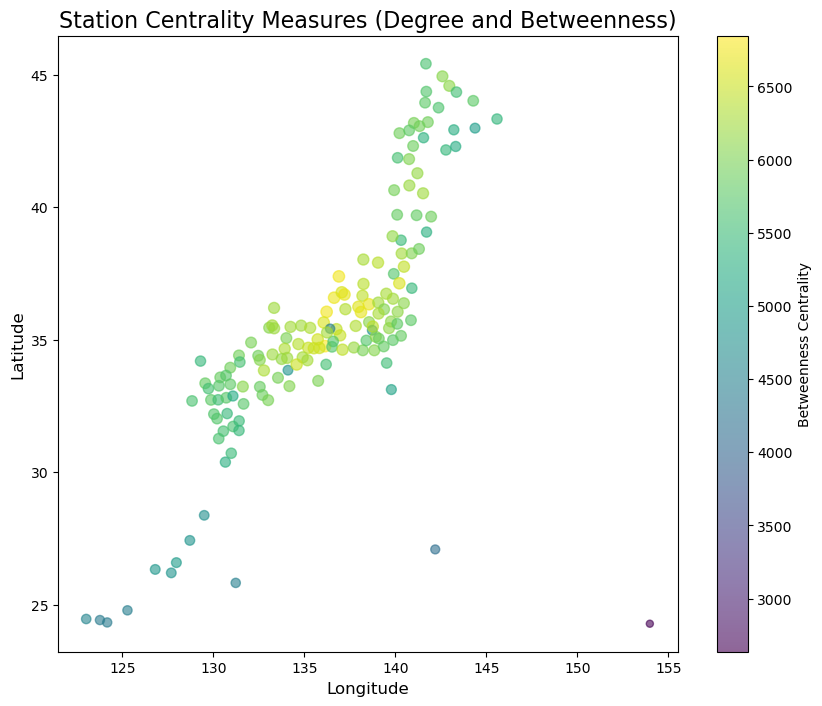

In [145]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np


# Step 1: Compute centralities (weighted)
weighted_degree_centrality = nx.degree_centrality(G)
for node in G.nodes:
    weighted_degree_centrality[node] = sum([G[node][neighbor]['weight'] for neighbor in G.neighbors(node)])

weighted_betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
weighted_closeness_centrality = nx.closeness_centrality(G, distance='weight')
weighted_eigenvector_centrality = nx.eigenvector_centrality(G, weight='weight')

# Extract positions (longitude, latitude) for plotting
positions = np.array([station_positions[node] for node in G.nodes])

# Get centrality measures
degree_centrality_values = np.array([weighted_degree_centrality[node] for node in G.nodes])
betweenness_centrality_values = np.array([weighted_betweenness_centrality[node] for node in G.nodes])
closeness_centrality_values = np.array([weighted_closeness_centrality[node] for node in G.nodes])
eigenvector_centrality_values = np.array([weighted_eigenvector_centrality[node] for node in G.nodes])

# Plot the scatter plot
plt.figure(figsize=(10, 8))

# Plot nodes with size based on degree centrality and color based on betweenness centrality
scatter = plt.scatter(positions[:, 0], positions[:, 1], 
                      s=degree_centrality_values*0.01, 
                      c=degree_centrality_values, 
                      cmap='viridis', 
                      alpha=0.6)

# Add color bar
plt.colorbar(scatter, label='Betweenness Centrality')

# Add labels for the stations
#for i, station in enumerate(G.nodes):
#    plt.text(positions[i, 0], positions[i, 1], str(station), fontsize=12, ha='right')

# Add titles and labels
plt.title('Station Centrality Measures (Degree and Betweenness)', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# Show the plot
plt.show()




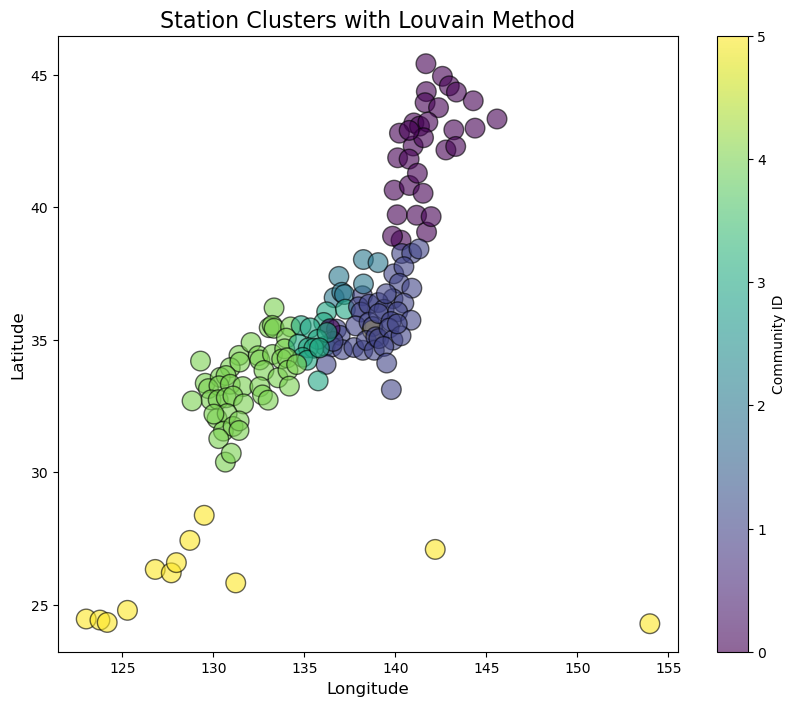

In [146]:

# Apply Louvain community detection
resolution = 1.1  # Adjust the resolution to control the number of clusters
partition = community_louvain.best_partition(G, resolution=resolution)
partition

# Get community IDs
communities = np.array([partition[node] for node in G.nodes])

# Step 3: Plot the nodes on a scatter plot with different colors based on clusters
plt.figure(figsize=(10, 8))

# Scatter plot with nodes colored by their community
scatter = plt.scatter(positions[:, 0], positions[:, 1], c=communities, cmap='viridis', s=200, alpha=0.6, edgecolors="k")

# Add color bar to show which colors correspond to which communities
plt.colorbar(scatter, label='Community ID')

# Add labels for the stations
#for i, station in enumerate(G.nodes):
#    plt.text(positions[i, 0], positions[i, 1], str(station), fontsize=12, ha='right')

# Add titles and labels
plt.title('Station Clusters with Louvain Method', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# Show the plot
plt.show()

In [24]:
# Step 1: Perform community detection (Louvain method)
partition = community_louvain.best_partition(G)  # This gives the community for each node

# Convert the Louvain partition to a node feature vector (just community ids)
node_features = np.array([partition[node] for node in G.nodes])

# Step 2: Apply Spectral Clustering to further split or merge communities
k = 5  # Specify the number of clusters you want
spectral = SpectralClustering(n_clusters=k, affinity='precomputed', assign_labels='kmeans')
adj_matrix = nx.to_numpy_array(G)  # Get the adjacency matrix
labels = spectral.fit_predict(adj_matrix)  # Spectral clustering labels

# Step 3: Visualize the results on the map with geographical positions
plt.figure(figsize=(10, 8))

# Extract geographical positions (longitude, latitude)
positions = np.array([station_positions[node] for node in G.nodes])

# Plot nodes with different colors based on clusters
scatter = plt.scatter(positions[:, 0], positions[:, 1], c=labels, cmap='viridis', s=200, alpha=0.6, edgecolors="k")

# Add color bar to show which colors correspond to which communities
plt.colorbar(scatter, label='Cluster ID')

# Add labels for the stations
#for i, station in enumerate(G.nodes):
#    plt.text(positions[i, 0], positions[i, 1], str(station), fontsize=12, ha='right')

# Add titles and labels
plt.title(f"Graph with {k} Clusters using Spectral Clustering", fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# Show the plot
plt.show()

NameError: name 'SpectralClustering' is not defined

In [99]:
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 1, 2, 3, 3, 3, 2, 2, 4, 4,
       2, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       3, 3, 1, 3, 3, 1, 3, 3, 3, 3, 3, 4], dtype=int32)